<a href="https://colab.research.google.com/github/FreddieMG/SolarMap-BeerSheva/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from PIL import Image
import numpy as np
import requests
import math
import pandas as pd
from pyproj import Transformer
import pyproj
from pyproj import Proj, transform
from dataclasses import dataclass
import os
import time
import random

## Calculate Conversion

In [ ]:
!pip install keplergl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.4/18.4 MB 36.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached ipywidgets-8.1.5-py3-none-any.whl.metadata (2.3 kB)
  Using cached jupyter_packaging-0.12.3-py3-none-any.whl.metadata (7.7 kB)
  Using cached comm-0.2.2-py3-none-any.whl.metadata (3.7 kB)
  Using cached widgetsnbextension-4.0.13-py3-none-any.whl.metadata (1.6 kB)
  Using cached deprecation-2.1.0-py2.py3-none-any.whl.metadata (4.6 kB)
  Using cached tomlkit-0.13.2-py3-none-any.whl.metadata (2.7 kB)
  Using cached async_lru-2.0.4-py3-none-any.whl.metadata (4.5 kB)
  Using cached ipykernel-6.29.5-py3-none-any.whl.metadata (6.3 kB)
  Using cached jupyter_lsp-2.2.5-py3-none-any.whl.metadata (1.8 kB)
  Using cached jupyter_server-2.15.0-py3-none-any.whl.metadata (8.4 kB)
  Using cached jupyterlab_server-2.27.3-py3-none-any.whl.metadata (5.9 kB)
  Using cached jedi-

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import xgboost as xgb
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, KFold, LeaveOneOut
from collections import Counter
import seaborn as sns
from keplergl import KeplerGl

In [ ]:
def enrich_data(df):
    enriched_rows = []
    for tile_x, tile_y, lat, lon in df.values:
        enriched_rows.append((lat, lon, tile_x, tile_y))
        enriched_rows.extend([
            (lat + 0.0003, lon, tile_x, tile_y),
            (lat - 0.0003, lon, tile_x, tile_y),
            (lat, lon + 0.0003, tile_x, tile_y),
            (lat, lon - 0.0003, tile_x, tile_y),
            (lat + 0.00018, lon, tile_x, tile_y - 1),
            (lat - 0.00018, lon, tile_x, tile_y + 1),
            (lat, lon + 0.00018, tile_x + 1, tile_y),
            (lat, lon - 0.00018, tile_x - 1, tile_y)
        ])
    return pd.DataFrame(enriched_rows, columns=[ "Latitude", "Longitude", "Tile X", "Tile Y"])

In [ ]:

# Define the dataset
data = {
    "Tile X": [386387, 386384, 386368, 386354, 386347, 386339, 386340, 386322, 386313, 386303,
               386380, 386381, 386366, 386365, 386365, 386375, 386390, 386509, 386497,
               386299, 386296, 386410, 386282, 386185, 386254, 386272, 386474, 386372],
    "Tile Y": [329804, 329794, 329790, 329778, 329771, 329770, 329706, 329696, 329691, 329682,
               329891, 329890, 329866, 329866, 329796, 329779, 329752, 329673, 329672,
               329682, 329683, 329759, 329569, 329831, 329878, 329943, 329528, 329542],
    "Latitude": [31.2556875, 31.2561502, 31.2585886, 31.2607074, 31.261758, 31.2629972,
                 31.2628012, 31.2655382, 31.2669169, 31.2684493,
                 31.2568109, 31.2566535, 31.2589334, 31.2590765, 31.259342, 31.25751,
                 31.2552006, 31.2369823, 31.2386684,
                 31.2690566, 31.2695143, 31.2521575, 31.2715813, 31.2865466, 31.2760357, 31.2733318, 31.2422517, 31.2578217],
    "Longitude": [34.800707, 34.7989317, 34.7982066, 34.7960643, 34.7948244, 34.7946314,
                  34.7832642, 34.7814665, 34.7805676, 34.7789572,
                  34.8161519, 34.8159859, 34.8117167, 34.8117036, 34.7996335, 34.7962414,
                  34.7914638, 34.7775036, 34.7773048,
                  34.7787758, 34.7793002, 34.79254, 34.7588443, 34.805368, 34.813778, 34.8253368, 34.7517012, 34.7541126]
}

df = pd.DataFrame(data)

# Function to enrich data


# Enrich training data
# df = enrich_data(df)

# Prepare input/output
X = df[["Latitude", "Longitude"]].values
Y = df[["Tile X", "Tile Y"]].values

# Define cross-validation and grid search parameters
param_grid = {
    'poly__degree': [2, 3, 4],
    'linreg__fit_intercept': [True, False]
}

# Create pipeline
pipeline = Pipeline([
    ("poly", PolynomialFeatures(include_bias=True)),
    ("linreg", LinearRegression())
])

# Perform grid search with k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(pipeline, param_grid, cv=kf, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X, Y)

# Best model parameters
best_params = grid_search.best_params_

# Train the best model on full enriched dataset
best_model = grid_search.best_estimator_
best_model.fit(X, Y)

# Evaluate the model
Y_pred = best_model.predict(X)
mae_x = mean_absolute_error(Y[:, 0], Y_pred[:, 0])
mae_y = mean_absolute_error(Y[:, 1], Y_pred[:, 1])

{
    "Best Parameters": best_params,
    "Mean Absolute Error (Tile X)": mae_x,
    "Mean Absolute Error (Tile Y)": mae_y
}


{'Best Parameters': {'linreg__fit_intercept': True, 'poly__degree': 2},
 'Mean Absolute Error (Tile X)': 0.19222612022713292,
 'Mean Absolute Error (Tile Y)': 0.22931807521672454}

In [ ]:
with open('cv_best_model_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

## Exploring Geograpgic Data

In [ ]:
building_data = pd.read_csv("buildings.csv")
building_data.head(15)

,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,lon
0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,34.758581
1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,34.757832
2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,34.757287
3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,34.754166
4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,34.755126
5,1,0,מגורים,1,1,1,NaN,60.278002,178.433012,31.272604,34.761394
6,1,0,מגורים,2,1,1,NaN,64.709051,162.227906,31.275454,34.757008
7,1,0,מגורים,1,1,1,NaN,65.639425,201.177385,31.275026,34.755005
8,1,0,מגורים,1,1,1,NaN,67.495937,197.621660,31.273893,34.760259
9,1,0,מגורים,1,1,1,NaN,64.494369,197.656218,31.273426,34.758780


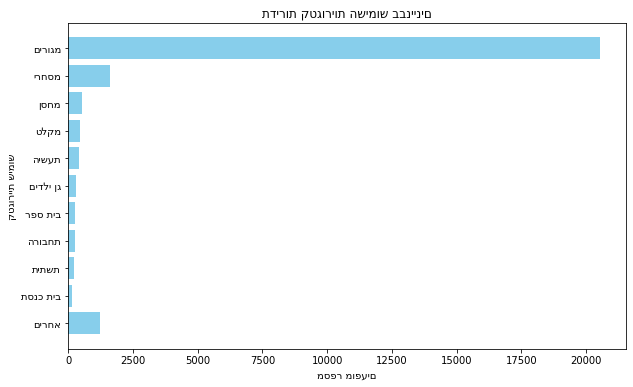

In [ ]:
# Count occurrences of each category
usage_counts = Counter(building_data['Used'].dropna())

# Sort by frequency and reverse Hebrew strings for correct display
sorted_usage = sorted(usage_counts.items(), key=lambda x: x[1], reverse=True)

# Limit to top 10 categories for better visualization
top_categories = sorted_usage[:10]
other_count = sum(count for _, count in sorted_usage[10:])

# Prepare data for visualization
categories = [name[::-1] for name, count in top_categories] + ['אחרים'[::-1]]
counts = [count for _, count in top_categories] + [other_count]

# Create bar chart with proper orientation for Hebrew
plt.figure(figsize=(10, 6))
plt.barh(categories, counts, color='skyblue')
plt.xlabel('מספר מופעים')
plt.ylabel('קטגוריית שימוש')
plt.title('תדירות קטגוריות השימוש בבניינים')
plt.gca().invert_yaxis()  # Ensure the highest frequency appears on top

# Show the plot
plt.show()
plt.show()

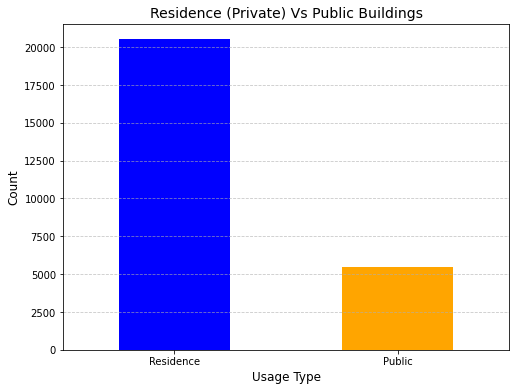

In [ ]:
# Group data into "מגורים" and "ציבורי"
building_data['Usage_Grouped'] = building_data['Used'].apply(lambda x: 'Residence' if x == 'מגורים' else 'Public')

# Count occurrences
usage_counts_grouped = building_data['Usage_Grouped'].value_counts()

# Plot the grouped data
plt.figure(figsize=(8, 6))
usage_counts_grouped.plot(kind='bar', color=['blue', 'orange'])

# Set labels and title
plt.xticks(rotation=0)
plt.xlabel('Usage Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Residence (Private) Vs Public Buildings', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.show()

In [ ]:
predicted_tiles = model.predict(building_data[["lat", "lon"]])
building_data['TileX'] = predicted_tiles[:, 0]  # Assuming the first column is TileX
building_data['TileY'] = predicted_tiles[:, 1]  # Assuming the second column is TileY

In [ ]:
building_data.to_csv("buildings_processed.csv")
building_data.head()

,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,lon,Usage_Grouped,TileX,TileY
0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,34.758581,Residence,386274.034383,329570.491965
1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,34.757832,Residence,386274.660861,329566.491028
2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,34.757287,Residence,386269.762749,329563.395261
3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,34.754166,Residence,386262.789930,329546.430814
4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,34.755126,Residence,386260.686916,329551.485326


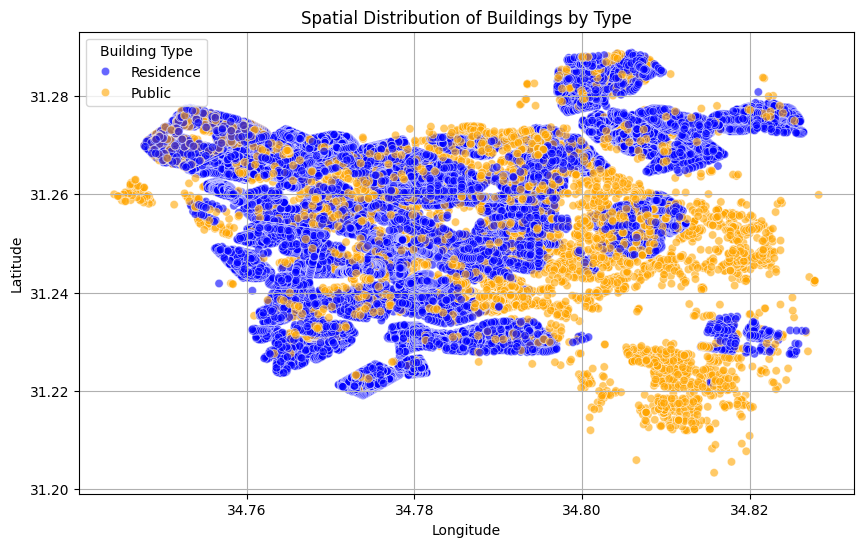

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=building_data['lon'],
    y=building_data['lat'],
    hue=building_data['Usage_Grouped'],
    palette={'Residence': 'blue', 'Public': 'orange'},
    alpha=0.6
)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Distribution of Buildings by Type')
plt.legend(title='Building Type')
plt.grid(True)

In [ ]:
building_data = pd.read_csv("buildings_processed.csv")
building_data

,Unnamed: 0,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,lon,Usage_Grouped,TileX,TileY
0,0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,34.758581,Residence,386274.034383,329570.491965
1,1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,34.757832,Residence,386274.660861,329566.491028
2,2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,34.757287,Residence,386269.762749,329563.395261
3,3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,34.754166,Residence,386262.789930,329546.430814
4,4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,34.755126,Residence,386260.686916,329551.485326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26028,26028,2,0,מגורים,2,2,1,NaN,86.052182,197.373573,31.228052,34.825559,Residence,386575.658723,329937.884511
26029,26029,1,0,מגורים,7,20,1,NaN,114.591560,401.116859,31.229622,34.825434,Residence,386564.781285,329937.796957
26030,26030,1,0,מגורים,7,20,1,NaN,114.385585,400.833125,31.229543,34.825800,Residence,386565.335835,329939.862163
26031,26031,1,0,טרפו,1,0,1,NaN,37.751319,82.280469,31.222190,34.824340,Public,386616.346616,329928.341081


In [ ]:

# Step 2: Initialize a KeplerGl map
map_1 = KeplerGl(height=600)

# Step 3: Add data to the map
map_1.add_data(data=building_data, name="Buildings")

# Step 4: Define the map configuration to color by 'Usage_Grouped'
config = {
    "version": "v1",
    "config": {
        "visState": {
            "filters": [],
            "layers": [
                {
                    "id": "usage_grouped_layer",
                    "type": "point",
                    "config": {
                        "dataId": "Buildings",
                        "label": "Usage_Grouped",
                        "color": [18, 147, 154],
                        "columns": {
                            "lat": "lat",
                            "lng": "lon"
                        },
                        "isVisible": True,
                        "visConfig": {
                            "radius": 10,
                            "fixedRadius": False,
                            "opacity": 0.8,
                            "outline": False,
                            "thickness": 2,
                            "strokeColor": None,
                            "colorRange": {
                                "name": "Category10",
                                "type": "categorical",
                                "category": "Uber",
                                "colors": [
                                    "#1f77b4",
                                    "#ff7f0e",
                                    "#2ca02c",
                                    "#d62728",
                                    "#9467bd",
                                    "#8c564b",
                                    "#e377c2",
                                    "#7f7f7f",
                                    "#bcbd22",
                                    "#17becf"
                                ]
                            },
                            "radiusRange": [0, 50],
                            "filled": True
                        },
                        "hidden": False,
                        "textLabel": [
                            {
                                "field": None,
                                "color": [255, 255, 255],
                                "size": 18,
                                "offset": [0, 0],
                                "anchor": "start",
                                "alignment": "center"
                            }
                        ]
                    },
                    "visualChannels": {
                        "colorField": {
                            "name": "Usage_Grouped",
                            "type": "string"
                        },
                        "colorScale": "ordinal"
                    }
                }
            ],
            "interactionConfig": {
                "tooltip": {
                    "fieldsToShow": {
                        "Buildings": ["Name", "Usage_Grouped", "floors", "appartment"]
                    },
                    "enabled": True
                },
                "brush": {}
            },
            "layerBlending": "normal",
            "splitMaps": [],
            "animationConfig": {
                "currentTime": None,
                "speed": 1
            }
        },
        "mapState": {
            "bearing": 0,
            "dragRotate": False,
            "latitude": building_data['lat'].mean(),
            "longitude": building_data['lon'].mean(),
            "pitch": 0,
            "zoom": 12,
            "isSplit": False
        },
        "mapStyle": {
            "topLayerGroups": {},
            "visibleLayerGroups": {
                "label": True,
                "road": True,
                "border": False,
                "building": True,
                "water": True,
                "land": True,
                "3d building": True
            },
            "threeDBuildingColor": [9.665468314072013, 17.183054780572488, 31.1442867897876],
            "mapStyles": {}
        }
    }
}

# Apply the configuration to the map
map_1.config = config

# Step 5: Save the map to an HTML file
map_1.save_to_html(file_name='building_usage_map.html')



User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


/storage/modules/envs/jupyterlab/lib/python3.12/site-packages/jupyter_client/session.py:721: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant: nan
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)


Map saved to building_usage_map.html!


## Scraping Satelite images for Solar Panel Count

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
from queue import Queue
from threading import Thread
from concurrent.futures import ThreadPoolExecutor
import requests
import subprocess
import os
import time
import pandas as pd
import random

In [ ]:
with open('cv_best_model_model.pkl', 'rb') as f:
    loaded_model = pickle.load(f)

In [ ]:
years_dictionary = { 2024: "OrthoPhoto20240503",
2023: "OrthoPhoto20230701",
2022: "OrthoPhoto20221216",
2021: "OrthoPhoto202106",
2020: "OrthoPhoto202010",
2019: "orthophoto_2019",
2018: "Orthophoto_2018",
2017: "orthophoto2017",
2016: "orthophoto_2016",
2010: "OrthoPhoto_2010"}

In [ ]:
## Finds the smallest zoom avaliable for that year - they are all in practice the same amount of zoom
z_dict = {2010 : 9,
2017 : 9,
2018 : 8,
2019 : 9,
2020 : 9,
2021 : 9,
2022 : 8,
2023 : 8,
2024 : 8}

In [ ]:
def request_tile_url(file_name, url):

    # Define headers
    headers = {
        "Accept": "text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7",
        "Accept-Encoding": "gzip, deflate, br, zstd",
        "Accept-Language": "en-US,en;q=0.9",
        "Connection": "keep-alive",
        "Host": "gis.br7.org.il",
        "Sec-Fetch-Dest": "document",
        "Sec-Fetch-Mode": "navigate",
        "Sec-Fetch-Site": "none",
        "Sec-Fetch-User": "?1",
        "Upgrade-Insecure-Requests": "1",
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/131.0.0.0 Safari/537.36",
        "sec-ch-ua": '"Google Chrome";v="131", "Chromium";v="131", "Not_A Brand";v="24"',
        "sec-ch-ua-mobile": "?0",
        "sec-ch-ua-platform": '"Windows"'
    }

    # Send GET request
    response = requests.get(url, headers=headers)

    # Save the response content to a file
    if response.status_code == 200:
        with open(file_name, "wb") as file:
            file.write(response.content)
        print("Image downloaded and saved")
    else:
        print(f"Failed to download image. Status code: {response.status_code}")
        print("Response:", response.text)


In [ ]:
for year in z_dict.keys():
    request_tile_cords(f"temp/{year}2.jpeg", 386359, 329811, year, )

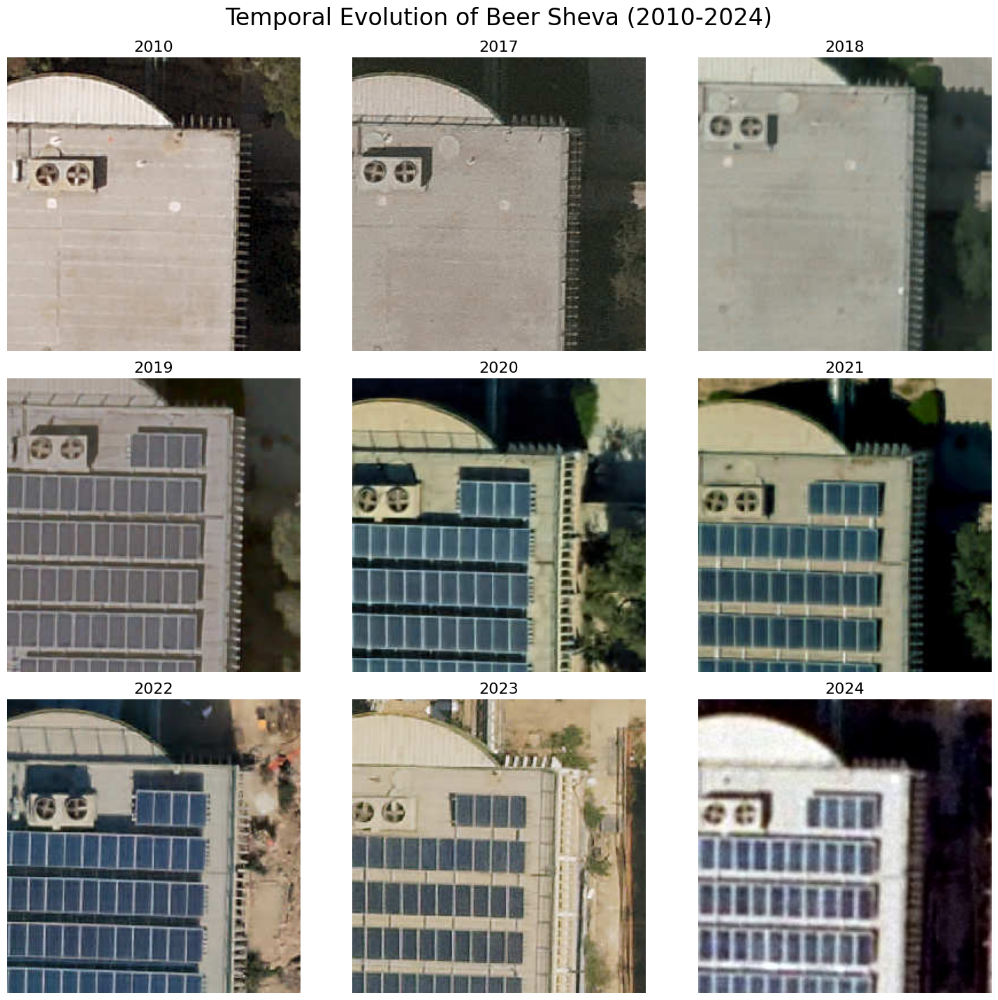

In [ ]:
# Define the directory containing the images
image_dir = "temp/"

# Define the years and corresponding image filenames
years = [2010, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
image_filenames = [f"{year}.jpeg" for year in years]
fig, axes = plt.subplots(3, 3, figsize=(15, 15))  # Adjust figsize as needed

# Flatten the axes array for easy iteration
axes = axes.flatten()

for ax, year, filename in zip(axes, years, image_filenames):
    img_path = os.path.join(image_dir, filename)
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(f"{year}", fontsize=16)
    ax.axis('off')  # Hide the axes ticks

# Add a main title to the figure
plt.suptitle("Temporal Evolution of Beer Sheva (2010-2024)", fontsize=24, y=0.95)

# Adjust layout to prevent overlap
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("beer_sheva_temporal_evolution_grid.png", dpi=300)

# Display the figure
plt.show()

In [ ]:
import pandas as pd
buildings_processed = pd.read_csv("buildings_processed.csv")
buildings_processed[["TileX", "TileY"]]

,TileX,TileY
0,386275.795010,329567.670878
1,386276.584324,329563.460880
2,386271.567263,329560.434410
3,386264.856001,329542.971957
4,386262.463691,329548.376993
...,...,...
26028,386567.242302,329944.131912
26029,386557.063797,329943.394026
26030,386557.580553,329945.461918
26031,386605.198378,329937.381530


In [ ]:
# Ensure buildings_processed has the correct columns for prediction
predictions = loaded_model.predict(buildings_processed[["lat", "lon"]])

# Assuming the predictions are returned as an array with two columns: TileX and TileY
buildings_processed["TileX"] = predictions[:, 0]  # Assign first column to TileX
buildings_processed["TileY"] = predictions[:, 1]  # Assign second column to TileY

# Verify the updated DataFrame
buildings_processed.head()

/home/freddie/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but PolynomialFeatures was fitted without feature names
  warnings.warn(


,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,lon,Usage_Grouped,TileX,TileY
0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,34.758581,Residence,386275.795010,329567.670878
1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,34.757832,Residence,386276.584324,329563.460880
2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,34.757287,Residence,386271.567263,329560.434410
3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,34.754166,Residence,386264.856001,329542.971957
4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,34.755126,Residence,386262.463691,329548.376993


In [ ]:
for year in years:
    buildings_processed[f'solar_{year}'] = 0

In [ ]:
# buildings_processed.to_csv("buildings_processed.csv", index=False)

In [ ]:
# Constants
base_dir = "/sise/home/freddie/Projects/SolarPanels"
years = [2010, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
years_dictionary = { 2024: "OrthoPhoto20240503",
2023: "OrthoPhoto20230701",
2022: "OrthoPhoto20221216",
2021: "OrthoPhoto202106",
2020: "OrthoPhoto202010",
2019: "orthophoto_2019",
2018: "Orthophoto_2018",
2017: "orthophoto2017",
2016: "orthophoto_2016",
2010: "OrthoPhoto_2010"}
z_dict = {2010: 9, 2017: 9, 2018: 8, 2019: 9, 2020: 9, 2021: 9, 2022: 8, 2023: 8, 2024: 8}

In [ ]:
def request_tile_cords_fixed(file_name, x, y, year):
    year_str = years_dictionary[year]
    z = z_dict[year]

    url = f"https://gis.br7.org.il/arcgis/rest/services/basemaps/{year_str}/MapServer/tile/{z}/{x}/{y}"
    # url = "https://gis.br7.org.il//arcgis/rest/services/basemaps/OrthoPhoto20230701/MapServer/tile/5/48296/4123"

    headers = {
        "Accept": "text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7",
        "Accept-Encoding": "gzip, deflate, br, zstd",
        "Accept-Language": "en-US,en;q=0.9",
        "Connection": "keep-alive",
        "Host": "gis.br7.org.il",
        "Sec-Fetch-Dest": "document",
        "Sec-Fetch-Mode": "navigate",
        "Sec-Fetch-Site": "none",
        "Sec-Fetch-User": "?1",
        "Upgrade-Insecure-Requests": "1",
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/131.0.0.0 Safari/537.36",
        "sec-ch-ua": '"Google Chrome";v="131", "Chromium";v="131", "Not_A Brand";v="24"',
        "sec-ch-ua-mobile": "?0",
        "sec-ch-ua-platform": '"Windows"'
    }

    session = requests.Session()
    # session.headers.update(headers)

    response = session.get(url)

    if response.status_code == 200 and b'"error"' not in response.content:
        with open(file_name, "wb") as file:
            file.write(response.content)
        print(f"Image downloaded and saved as {file_name}")
        return True
    else:
        print(f"Failed to download image. Status code: {response.status_code}, Response: {response.text}")
        return False

In [ ]:
buildings_processed = pd.read_csv("buildings_processed.csv")
buildings_processed

,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,...,TileY,solar_2010,solar_2017,solar_2018,solar_2019,solar_2020,solar_2021,solar_2022,solar_2023,solar_2024
0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,...,329567.670878,0,0,0,0,0,0,0,0,0
1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,...,329563.460880,0,0,0,0,0,0,0,0,0
2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,...,329560.434410,0,0,0,0,0,0,0,0,0
3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,...,329542.971957,0,0,0,0,0,0,0,0,0
4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,...,329548.376993,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26028,2,0,מגורים,2,2,1,NaN,86.052182,197.373573,31.228052,...,329944.131912,0,0,0,0,0,0,0,0,0
26029,1,0,מגורים,7,20,1,NaN,114.591560,401.116859,31.229622,...,329943.394026,0,0,0,0,0,0,0,0,0
26030,1,0,מגורים,7,20,1,NaN,114.385585,400.833125,31.229543,...,329945.461918,0,0,0,0,0,0,0,0,0
26031,1,0,טרפו,1,0,1,NaN,37.751319,82.280469,31.222190,...,329937.381530,0,0,0,0,0,0,0,0,0


In [ ]:
request_tile_cords_fixed(f"d..jpeg", 386359, 329811, 2020 )

Image downloaded and saved as d..jpeg


True

In [ ]:
def download_tile_task(row, year):
    """
    Download tile for a given row and year, ensuring retries and rate limits.
    """
    x, y = int(round(row['TileX'])), int(round(row['TileY']))
    tile_filename = f"tiles/{year}/tile_{x}_{y}.jpeg"

    if not os.path.isfile(os.path.join(base_dir, tile_filename)):
        print(f"Requesting: {tile_filename}")
        success = request_tile_cords_fixed(tile_filename, x, y, year)
        if success:
            # Introduce a random short delay to prevent overloading the server
            time.sleep(random.uniform(0.02, 0.05))
        return success
    else:
        # print(f"Already exists: {tile_filename}")
        return True


In [ ]:
def process_buildings_parallel(buildings_df, max_workers=4):
    """
    Process downloading GIS tiles using threading for parallel requests.
    """
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = []
        for _, row in buildings_df.iterrows():
            for year in years:
                futures.append(executor.submit(download_tile_task, row, year))

        for future in futures:
            future.result()  # Ensure all tasks complete

In [ ]:
process_buildings_parallel(buildings_processed)

Requesting: tiles/2010/tile_386276_329568.jpeg
Requesting: tiles/2017/tile_386276_329568.jpeg
Requesting: tiles/2019/tile_386276_329568.jpeg
Requesting: tiles/2018/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2017/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2018/tile_386276_329568.jpeg
Requesting: tiles/2020/tile_386276_329568.jpeg
Requesting: tiles/2021/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2010/tile_386276_329568.jpeg
Requesting: tiles/2022/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2019/tile_386276_329568.jpeg
Requesting: tiles/2023/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2020/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2021/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2023/tile_386276_329568.jpeg
Image downloaded and saved as tiles/2022/tile_386276_329568.jpeg
Requesting: tiles/2010/tile_386277_329563.jpeg
Requesting: tiles/2017/tile_386277_329563.jpeg
Requesting

## Solar Panel Identification

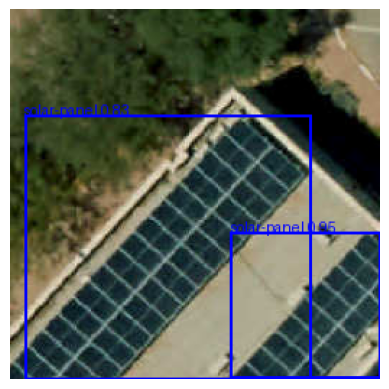

In [ ]:
# Load the image
image_path = "/sise/home/freddie/Projects/SolarPanels/temp/test2.jpeg"

# Perform inference
results = model.predict(source=image_path, conf=0.5, save=False)[0]  # Access the first result

# Display results using PIL and Matplotlib
display_results_with_pil(image_path, results)

In [ ]:
model = YOLO("solar-panels-segmentation.pt")
for idx, row in buildings_processed.iterrows():
    x, y = int(round(row['TileX'])), int(round(row['TileY']))
    for year in years:
        tile_filename = f"tiles/{year}/tile_{x}_{y}.jpeg"
        # print(tile_filename)
        if os.path.isfile(tile_filename):
            results = model.predict(source=tile_filename, conf=0.7, save=False, verbose=False)[0]
            if len(results.boxes.xyxy) == 0:
                is_solar = 0
            else:
                is_solar = 1
                # display_results_with_pil(tile_filename, results)
            buildings_processed.loc[idx, f"solar_{year}"] = is_solar
        else:
            print("doesnt exist")

doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist
doesnt exist

In [ ]:
buildings_processed.to_csv("buildings_processed_with_solar_info.csv", index=False)
buildings_processed = pd.read_csv("buildings_processed_with_solar_info.csv")

In [ ]:
buildings_processed

,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,...,TileY,solar_2010,solar_2017,solar_2018,solar_2019,solar_2020,solar_2021,solar_2022,solar_2023,solar_2024
0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,...,329567.670878,0,0,0,0,0,0,0,0,0
1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,...,329563.460880,0,0,0,0,0,0,0,0,1
2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,...,329560.434410,0,0,0,0,0,0,0,0,0
3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,...,329542.971957,0,0,0,0,1,1,1,0,1
4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,...,329548.376993,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26028,2,0,מגורים,2,2,1,NaN,86.052182,197.373573,31.228052,...,329944.131912,0,0,0,0,0,0,0,0,0
26029,1,0,מגורים,7,20,1,NaN,114.591560,401.116859,31.229622,...,329943.394026,0,0,0,0,0,0,0,0,0
26030,1,0,מגורים,7,20,1,NaN,114.385585,400.833125,31.229543,...,329945.461918,0,0,0,0,0,0,0,0,0
26031,1,0,טרפו,1,0,1,NaN,37.751319,82.280469,31.222190,...,329937.381530,0,0,0,0,0,0,0,0,0


In [ ]:
solar_cols = [f"solar_{year}" for year in years]
for col in solar_cols:
    print(f" {col} : {buildings_processed[col].sum()}")

 solar_2010 : 697
 solar_2017 : 848
 solar_2018 : 2338
 solar_2019 : 384
 solar_2020 : 992
 solar_2021 : 861
 solar_2022 : 3154
 solar_2023 : 1219
 solar_2024 : 2077


### interesting case


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2010/tile_386563_329619.jpeg: 640x640 1 solar-panel, 6.5ms
Speed: 8.8ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


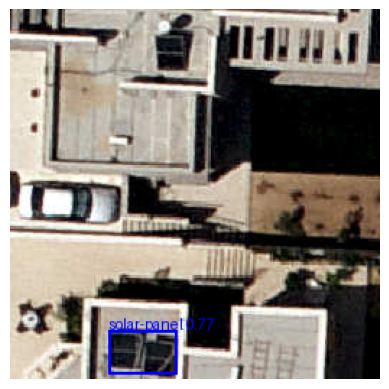


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2017/tile_386563_329619.jpeg: 640x640 (no detections), 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


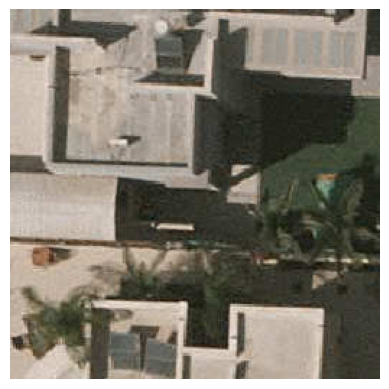


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2020/tile_386563_329619.jpeg: 640x640 (no detections), 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


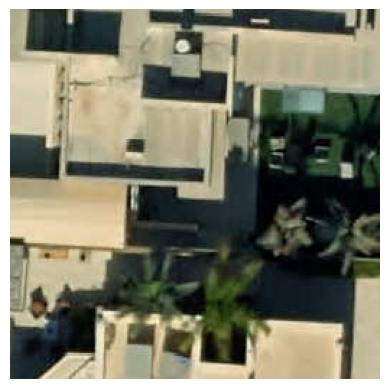


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2021/tile_386563_329619.jpeg: 640x640 1 solar-panel, 6.2ms
Speed: 1.5ms preprocess, 6.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


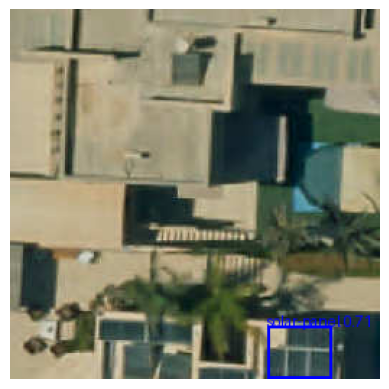

In [ ]:

image_path = "tiles/2010/tile_386563_329619.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)

image_path = "tiles/2017/tile_386563_329619.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)


image_path = "tiles/2020/tile_386563_329619.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)

image_path = "tiles/2021/tile_386563_329619.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)



### example of 2022 false positive


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2022/tile_386417_329761.jpeg: 640x640 4 solar-panels, 6.8ms
Speed: 8.5ms preprocess, 6.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


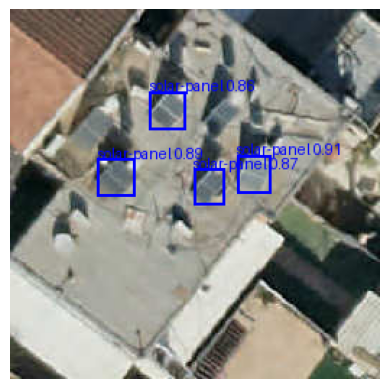


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2023/tile_386417_329761.jpeg: 640x640 (no detections), 6.3ms
Speed: 2.1ms preprocess, 6.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


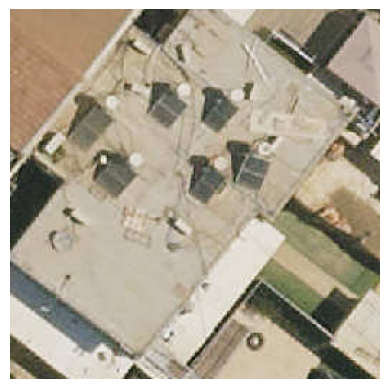

In [ ]:
image_path = "tiles/2022/tile_386417_329761.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)

image_path = "tiles/2023/tile_386417_329761.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)


### example of 2023 false negetive


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2023/tile_386265_329543.jpeg: 640x640 (no detections), 6.6ms
Speed: 1.6ms preprocess, 6.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


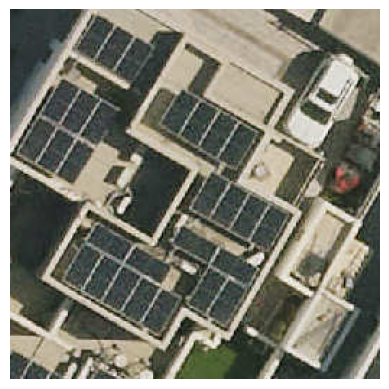


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2022/tile_386265_329543.jpeg: 640x640 3 solar-panels, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


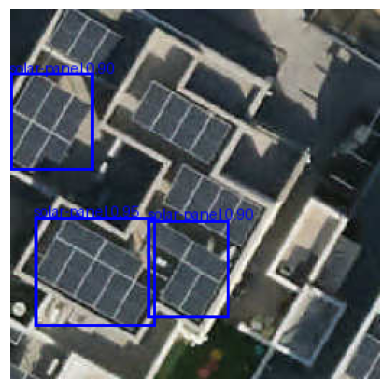

In [ ]:

image_path = "tiles/2023/tile_386265_329543.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)

image_path = "tiles/2022/tile_386265_329543.jpeg"
results = model.predict(source=image_path, conf=0.9, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)



image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2023/tile_386277_329530.jpeg: 640x640 (no detections), 6.4ms
Speed: 8.7ms preprocess, 6.4ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


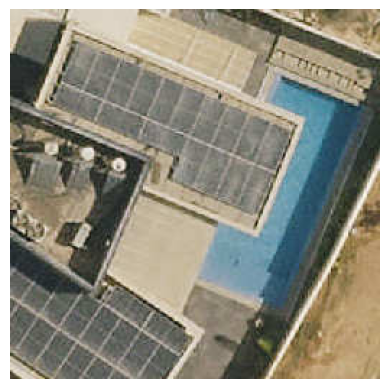


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2022/tile_386277_329530.jpeg: 640x640 2 solar-panels, 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


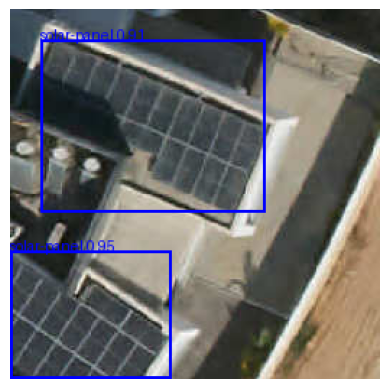


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2021/tile_386277_329530.jpeg: 640x640 (no detections), 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


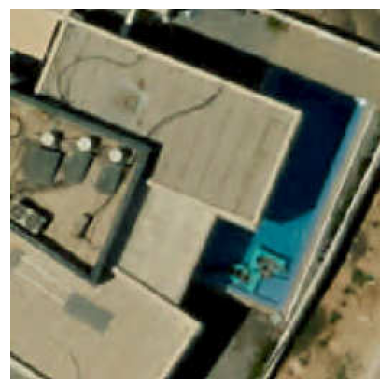

In [ ]:



image_path = "tiles/2023/tile_386277_329530.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)

image_path = "tiles/2022/tile_386277_329530.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)

image_path = "tiles/2021/tile_386277_329530.jpeg"
results = model.predict(source=image_path, conf=0.7, save=False)[0]  # Access the first result
display_results_with_pil(image_path, results)


### Postprocessing

In [ ]:
# Rectify False Positives in 2022
mask_2022 = (
    (buildings_processed['solar_2022'] == 1) &
    (buildings_processed['solar_2023'] == 0) &
    (buildings_processed['solar_2024'] == 0)
)
buildings_processed.loc[mask_2022, 'solar_2022'] = 0

# Correct False Negatives in 2023
mask_2023 = (
    (buildings_processed['solar_2022'] == 1) &
    (buildings_processed['solar_2024'] == 1) &
    (buildings_processed['solar_2023'] == 0)
)
buildings_processed.loc[mask_2023, 'solar_2023'] = 1

mask_2020 = (
    (buildings_processed['solar_2020'] == 1) &
    (buildings_processed['solar_2023'] == 0) &
    (buildings_processed['solar_2024'] == 0)
)
buildings_processed.loc[mask_2020, 'solar_2020'] = 0

mask_2018 = (
    (buildings_processed['solar_2018'] == 1) &
    (buildings_processed['solar_2023'] == 0) &
    (buildings_processed['solar_2024'] == 0)
)
buildings_processed.loc[mask_2018, 'solar_2018'] = 0

mask_2017 = (
    (buildings_processed['solar_2017'] == 1) &
    (buildings_processed['solar_2023'] == 0) &
    (buildings_processed['solar_2024'] == 0) &
    (buildings_processed['solar_2020'] == 0) &
    (buildings_processed['solar_2019'] == 0)


)
buildings_processed.loc[mask_2017, 'solar_2018'] = 0

mask_2010 = (
    (buildings_processed['solar_2010'] == 1) &
    (buildings_processed['solar_2023'] == 0) &
    (buildings_processed['solar_2024'] == 0) &
    (buildings_processed['solar_2020'] == 0) &
    (buildings_processed['solar_2019'] == 0)
)
buildings_processed.loc[mask_2010, 'solar_2018'] = 0



In [ ]:
solar_cols = [f"solar_{year}" for year in years]
for col in solar_cols:
    print(f" {col} : {buildings_processed[col].sum()}")

 solar_2010 : 697
 solar_2017 : 848
 solar_2018 : 525
 solar_2019 : 384
 solar_2020 : 390
 solar_2021 : 861
 solar_2022 : 1235
 solar_2023 : 1663
 solar_2024 : 2077


In [ ]:
delete_cols =  [f"solar_{year}" for year in [2010, 2017, 2018]]
buildings_processed = buildings_processed.drop(columns=delete_cols)
buildings_processed

,Entrances,Not_reside,Used,floors,appartment,RuleID,Name,Shape_Leng,Shape_Area,lat,lon,Usage_Grouped,TileX,TileY,solar_2019,solar_2020,solar_2021,solar_2022,solar_2023,solar_2024
0,1,0,מגורים,1,1,1,NaN,67.084762,169.097805,31.272508,34.758581,Residence,386275.795010,329567.670878,0,0,0,0,0,0
1,1,0,מגורים,1,1,1,NaN,63.022146,194.503221,31.272385,34.757832,Residence,386276.584324,329563.460880,0,0,0,0,0,1
2,1,0,מגורים,1,1,1,NaN,65.366300,195.642293,31.273145,34.757287,Residence,386271.567263,329560.434410,0,0,0,0,0,0
3,1,0,מגורים,2,1,1,NaN,71.076993,214.742720,31.274151,34.754166,Residence,386264.856001,329542.971957,0,1,1,1,1,1
4,1,0,מגורים,1,1,1,NaN,63.432716,203.592853,31.274520,34.755126,Residence,386262.463691,329548.376993,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26028,2,0,מגורים,2,2,1,NaN,86.052182,197.373573,31.228052,34.825559,Residence,386567.242302,329944.131912,0,0,0,0,0,0
26029,1,0,מגורים,7,20,1,NaN,114.591560,401.116859,31.229622,34.825434,Residence,386557.063797,329943.394026,0,0,0,0,0,0
26030,1,0,מגורים,7,20,1,NaN,114.385585,400.833125,31.229543,34.825800,Residence,386557.580553,329945.461918,0,0,0,0,0,0
26031,1,0,טרפו,1,0,1,NaN,37.751319,82.280469,31.222190,34.824340,Public,386605.198378,329937.381530,0,0,0,0,0,0


In [ ]:
buildings_processed.to_csv("buildings_processed_final.csv", index=False)


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2022/tile_386417_329761.jpeg: 640x640 4 solar-panels, 6.4ms
Speed: 8.6ms preprocess, 6.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2023/tile_386417_329761.jpeg: 640x640 (no detections), 6.3ms
Speed: 1.5ms preprocess, 6.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)


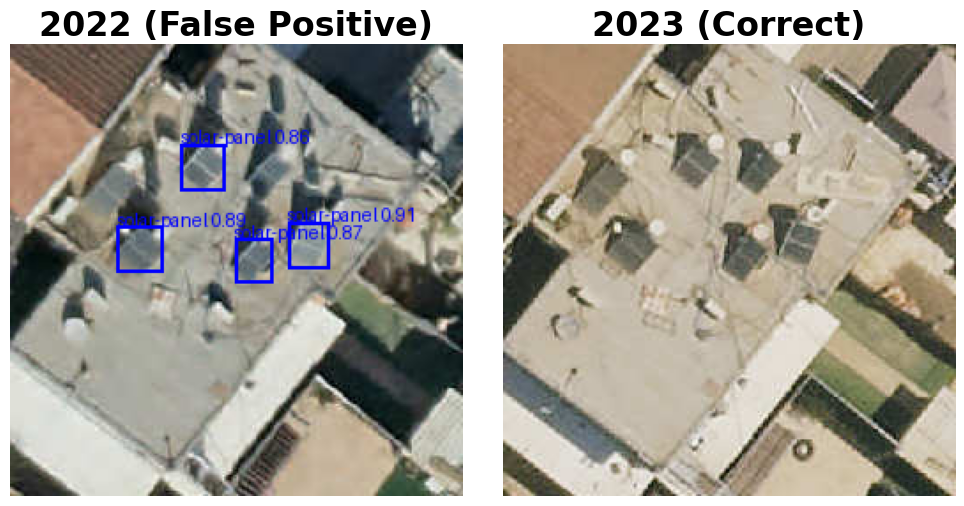


image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2023/tile_386265_329543.jpeg: 640x640 (no detections), 6.5ms
Speed: 1.6ms preprocess, 6.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /sise/home/freddie/Projects/SolarPanels/tiles/2022/tile_386265_329543.jpeg: 640x640 3 solar-panels, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


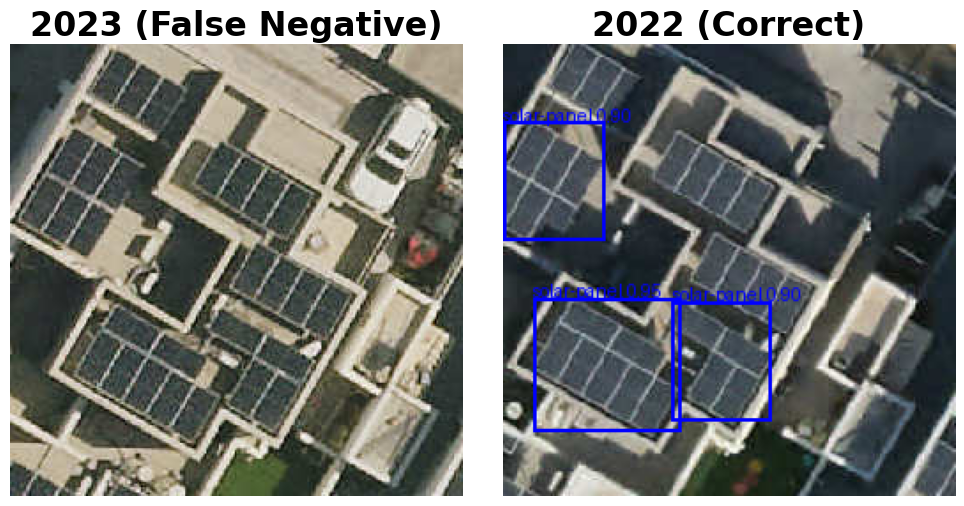

In [ ]:
# Function to display and save results
def generate_comparison_figure(image_paths, conf_thresholds, titles, output_filename):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    for idx, (image_path, conf, title) in enumerate(zip(image_paths, conf_thresholds, titles)):
        # Perform inference
        results = model.predict(source=image_path, conf=conf, save=False)[0]

        # Load image and annotate
        img = Image.open(image_path).convert("RGB")
        draw = ImageDraw.Draw(img)
        font = ImageFont.load_default()

        for box in results.boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            conf_score = box.conf[0].item()
            cls = int(box.cls[0].item())
            label = f"{results.names[cls]} {conf_score:.2f}"
            draw.rectangle([x1, y1, x2, y2], outline="blue", width=2)
            draw.text((x1, y1 - 10), label, fill="blue", font=font)

        # Display annotated image
        axes[idx].imshow(img)
        axes[idx].axis("off")
        axes[idx].set_title(title, fontsize=24, fontweight='bold')  # Increased title font size

    plt.tight_layout()
    plt.savefig(output_filename, dpi=300)
    plt.show()

# Case 1: 2022 False Positive (Sun-heated water tank misclassified)
image_paths_fp = [
    "tiles/2022/tile_386417_329761.jpeg",
    "tiles/2023/tile_386417_329761.jpeg"
]
conf_thresholds_fp = [0.7, 0.7]
titles_fp = ["2022 (False Positive)", "2023 (Correct)"]
generate_comparison_figure(image_paths_fp, conf_thresholds_fp, titles_fp, "false_positive_2022_vs_2023.png")

# Case 2: 2023 False Negative (Missed solar panel)
image_paths_fn = [
    "tiles/2023/tile_386265_329543.jpeg",
    "tiles/2022/tile_386265_329543.jpeg"
]
conf_thresholds_fn = [0.7, 0.9]
titles_fn = ["2023 (False Negative)", "2022 (Correct)"]
generate_comparison_figure(image_paths_fn, conf_thresholds_fn, titles_fn, "false_negative_2023_vs_2022.png")


## Analysis

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joypy
import matplotlib.colors as mcolors
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from pandas.plotting import parallel_coordinates
import matplotlib.cm as cm
import plotly.express as px
from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.pyplot as plt
import folium
from keplergl import KeplerGl


In [ ]:
buildings_processed = pd.read_csv("buildings_processed_final.csv")

In [ ]:
buildings_data = buildings_processed
years = [2019, 2020, 2021, 2022, 2023, 2024]
buildings_data['solar_installed'] = buildings_data[['solar_2019', 'solar_2020', 'solar_2021', 'solar_2022', 'solar_2023', 'solar_2024']].max(axis=1)
buildings_data['install_year'] = buildings_data[['solar_2019', 'solar_2020', 'solar_2021', 'solar_2022', 'solar_2023', 'solar_2024']].idxmax(axis=1).str.extract('(\d{4})').astype(float)
filtered_data = buildings_data[buildings_data['floors'].between(1, 10)]

<>:4: SyntaxWarning: invalid escape sequence '\d'
<>:4: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipykernel_372904/4129217671.py:4: SyntaxWarning: invalid escape sequence '\d'
  buildings_data['install_year'] = buildings_data[['solar_2019', 'solar_2020', 'solar_2021', 'solar_2022', 'solar_2023', 'solar_2024']].idxmax(axis=1).str.extract('(\d{4})').astype(float)


<Figure size 1000x600 with 0 Axes>

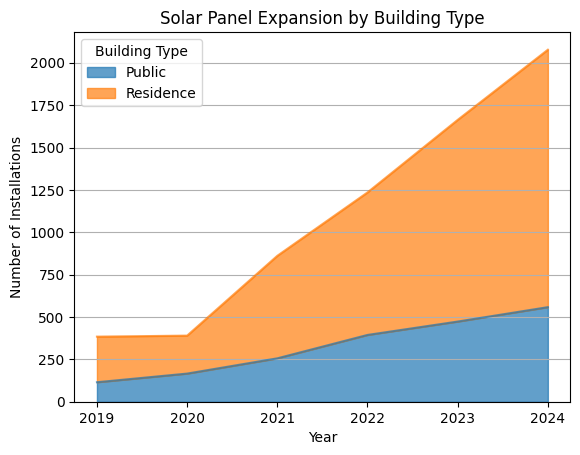

In [ ]:
solar_columns = ['solar_2019', 'solar_2020', 'solar_2021', 'solar_2022', 'solar_2023', 'solar_2024']
solar_columns_renamed = {col: col.replace('solar_', '') for col in solar_columns}
solar_columns = list(solar_columns_renamed.values())
buildings_data.rename(columns=solar_columns_renamed, inplace=True)

building_types = buildings_data.groupby('Usage_Grouped')[solar_columns].sum().T

plt.figure(figsize=(10, 6))
building_types.plot(kind='area', stacked=True, alpha=0.7)
plt.title('Solar Panel Expansion by Building Type')
plt.xlabel('Year')
plt.ylabel('Number of Installations')
plt.legend(title='Building Type')
plt.savefig("Solar_Panel_expandsion.pdf", format="pdf", bbox_inches="tight")
plt.grid(axis='y')
plt.show()

<Figure size 1000x600 with 0 Axes>

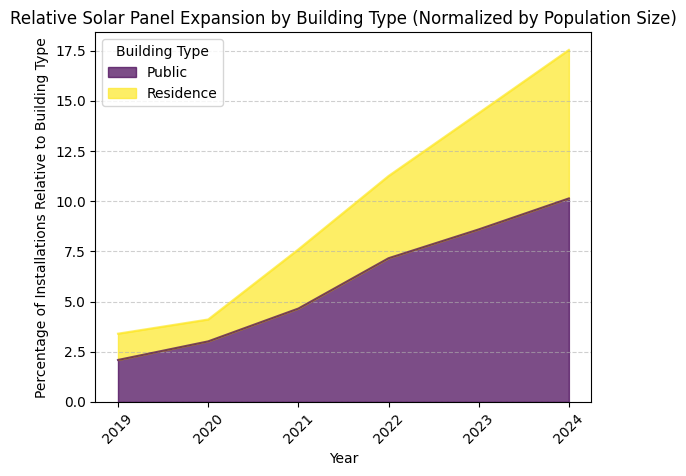

In [ ]:
# Calculate the total number of buildings for each usage type
total_buildings_per_type = buildings_data['Usage_Grouped'].value_counts()

# Normalize solar installations by the total number of buildings in each category
building_types_relative = building_types.div(total_buildings_per_type, axis=1) * 100

# Plot the adjusted percentage-based area chart
plt.figure(figsize=(10, 6))
building_types_relative.plot(kind='area', stacked=True, alpha=0.7, colormap='viridis')
plt.title('Relative Solar Panel Expansion by Building Type (Normalized by Population Size)')
plt.xlabel('Year')
plt.ylabel('Percentage of Installations Relative to Building Type')
plt.legend(title='Building Type')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.xticks(rotation=45)
plt.savefig("Solar_Panel_Expansion_Relative.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [ ]:
# 3. Packed Circle Chart (Approximation using Treemap with rounded style)
fig_packed_circle = px.treemap(buildings_data,
                               path=['Used'],
                               title="Building Usage Distribution (Packed Circles)",
                               color_discrete_sequence=px.colors.qualitative.Antique)
fig_packed_circle.update_traces(marker=dict(cornerradius=20), textinfo="label+value", textfont_size=98)
fig_packed_circle.write_html("fig_packed_circle.html")

In [ ]:
# Create GeoDataFrame from point data
gdf = gpd.GeoDataFrame(
    buildings_processed ,
    geometry=gpd.points_from_xy(buildings_processed.lon, buildings_processed.lat),
    crs="EPSG:4326"
)
gdf_filtered = gdf[gdf.solar_installed == 1]

/tmp/ipykernel_192514/3230034076.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('coolwarm', len(years))  # 'coolwarm' provides a more distinct gradient


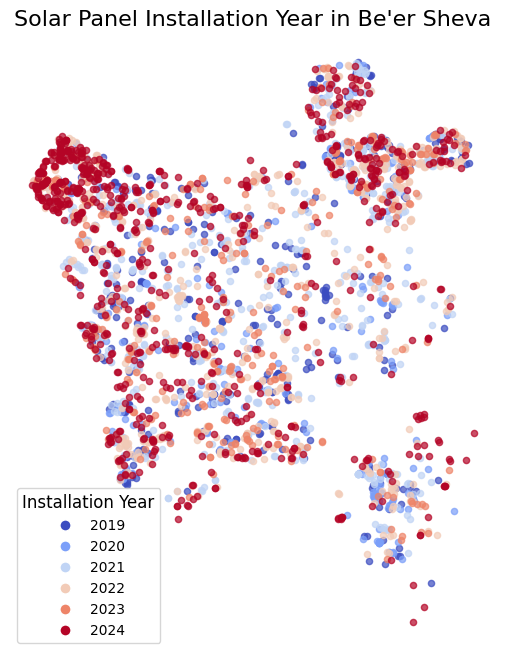

In [ ]:
# Adjust colormap to use a more distinguishable gradient (e.g., 'coolwarm')
cmap = plt.cm.get_cmap('coolwarm', len(years))  # 'coolwarm' provides a more distinct gradient

# Create a color mapping for the years using the colormap
gradient_colors = {year: cmap(i / (len(years) - 1)) for i, year in enumerate([2019, 2020, 2021, 2022, 2023, 2024])}

# Plot the first installation year for each location with smaller points and improved colors
fig, ax = plt.subplots(figsize=(10, 8))
for year, color in gradient_colors.items():
    gdf_filtered[gdf_filtered['install_year'] == year].plot(ax=ax, markersize=20, alpha=0.7, color=mcolors.to_hex(color), label=f'{year}')

# Add title and improved layout for clarity
ax.set_title("Solar Panel Installation Year in Be'er Sheva", fontsize=16)

# Create a custom legend with gradient colors
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=mcolors.to_hex(color), markersize=8, label=str(year))
           for year, color in gradient_colors.items()]
ax.legend(handles=handles, title="Installation Year", loc="lower left", fontsize=10, title_fontsize=12)

plt.axis('off')  # Remove axes for better clarity
plt.savefig("panel_over_years_improved.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [ ]:
# -----------------------------------------------------------------------------
# 1. DEFINE THE INSTALLATION YEARS
# -----------------------------------------------------------------------------
years = [2019, 2020, 2021, 2022, 2023, 2024]

# -----------------------------------------------------------------------------
# 2. DEFINE COLORMAP
# -----------------------------------------------------------------------------
# Using 'coolwarm' colormap; adjust as needed
cmap = cm.get_cmap('coolwarm', len(years))
gradient_colors = {year: mcolors.to_hex(cmap(i / (len(years) - 1))) for i, year in enumerate(years)}

# -----------------------------------------------------------------------------
# 3. FILTER AND PREPARE YOUR DATA
# -----------------------------------------------------------------------------
# Assuming 'gdf_filtered' is your filtered GeoDataFrame with 'solar_installed' == 1
# Ensure 'install_year' is integer and valid
gdf_filtered = gdf[gdf['solar_installed'] == 1].copy()
gdf_filtered['install_year'] = gdf_filtered['install_year'].astype(int)

# -----------------------------------------------------------------------------
# 4. CREATE FOLIUM MAP CENTERED ON Be'er Sheva
# -----------------------------------------------------------------------------
# Calculate the mean latitude and longitude from your filtered GeoDataFrame
center_lat = gdf_filtered['lat'].astype(float).mean()
center_lon = gdf_filtered['lon'].astype(float).mean()

# Initialize the Folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=13)

# -----------------------------------------------------------------------------
# 5. ADD CIRCLEMARKERS TO THE MAP BASED ON INSTALLATION YEAR
# -----------------------------------------------------------------------------
for _, row in gdf_filtered.iterrows():
    year = row['install_year']
    if year in gradient_colors:
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=6,  # Adjust radius as needed
            color=gradient_colors[year],
            fill=True,
            fill_color=gradient_colors[year],
            fill_opacity=0.7,
            popup=f"Year Installed: {year}"
        ).add_to(m)

# -----------------------------------------------------------------------------
# 6. ADD AN ENLARGED LEGEND TO THE MAP
# -----------------------------------------------------------------------------
# Define larger font size and color box size
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 300px;  /* Increased width */
    height: 300px; /* Increased height */
    background-color: white;
    z-index:9999;
    font-size:18px;
    padding: 15px;
    border-radius: 8px;
    box-shadow: 0px 0px 10px #888888;
    overflow-y: auto;  /* Enable scrolling if content overflows */
    ">
    <b style="font-size:22px;">Installation Year Legend</b><br>
    <br>
'''

# Add each year with an enlarged color box
for year, color in gradient_colors.items():
    legend_html += f'''
    <div style="display: flex; align-items: center; margin-bottom: 12px;">
        <i style="background:{color}; width:25px; height:25px; display:inline-block; margin-right:10px;"></i>
        <span>{year}</span>
    </div>
    '''

legend_html += '</div>'

# Add the legend to the map
m.get_root().html.add_child(folium.Element(legend_html))

# -----------------------------------------------------------------------------
# 7. OPTIONAL: ADD A TITLE OR ADDITIONAL TEXT TO THE MAP
# -----------------------------------------------------------------------------
# If you want to add a prominent title at the top of the map
title_html = '''
<div style="
    position: fixed;
    top: 10px;
    left: 50%;
    transform: translateX(-50%);
    z-index:10000;
    background-color: white;
    padding: 10px;
    border-radius: 5px;
    box-shadow: 0px 0px 5px #888888;
    font-size:24px;
    font-weight:bold;
    ">
    Solar Panel Installations Over Years
</div>
'''
m.get_root().html.add_child(folium.Element(title_html))

# -----------------------------------------------------------------------------
# 8. SAVE THE MAP TO AN HTML FILE AND DISPLAY IT
# -----------------------------------------------------------------------------
m.save("solar_installation_map_enhanced.html")
m

/tmp/ipykernel_214520/961622831.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('coolwarm', len(years))


### Additional Analysis

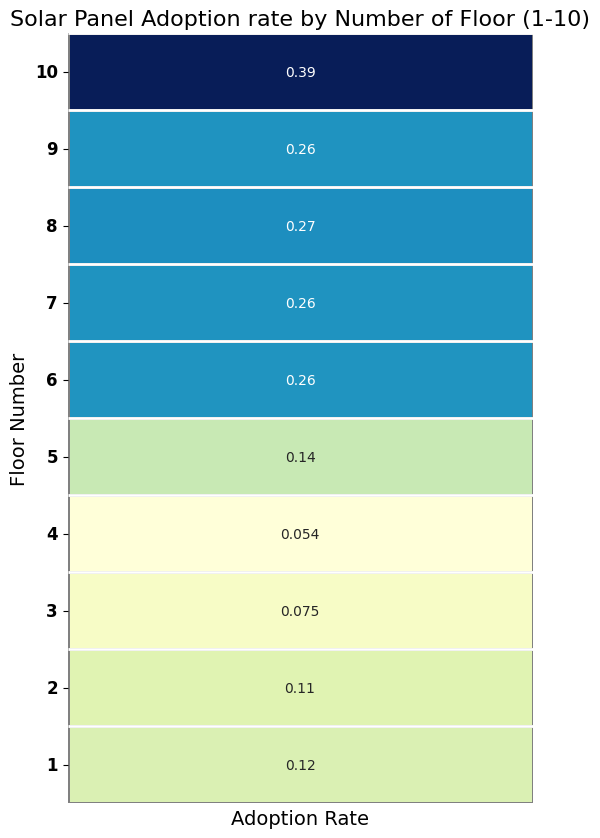

In [ ]:
# Flip the order of floors and remove the count column
floor_solar_pivot_filtered = floor_solar_pivot_filtered[['solar_installed']].sort_index(ascending=False)

# Create a visualization resembling a building structure
fig, ax = plt.subplots(figsize=(6, 10))

# Heatmap to represent solar panel adoption rate by floors (flipped order)
sns.heatmap(floor_solar_pivot_filtered, annot=True, cmap="YlGnBu", linewidths=1, linecolor='gray', cbar=False, ax=ax)

# Adjusting the aesthetics to resemble a building
ax.set_title('Solar Panel Adoption rate by Number of Floor (1-10)', fontsize=16)
ax.set_xlabel('Adoption Rate', fontsize=14)
ax.set_ylabel('Floor Number', fontsize=14)
ax.set_xticks([])  # Remove x-axis ticks for a cleaner look
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=12, fontweight='bold')

# Adding some "windows" effect by customizing the grid lines
for i in range(len(floor_solar_pivot_filtered)):
    ax.hlines(i, *ax.get_xlim(), color="white", linewidth=2)

plt.savefig("solar_panel_by_floor.pdf", format="pdf", bbox_inches="tight")
plt.show()


/tmp/ipykernel_372904/427118706.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  buildings_data_res['apartment_bins'] = pd.cut(buildings_data_res['appartment'], bins=bin_edges, labels=bin_labels)
/tmp/ipykernel_372904/427118706.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  solar_trend_by_bins_res = buildings_data_res.groupby('apartment_bins')[solar_columns].sum()


<Figure size 1200x600 with 0 Axes>

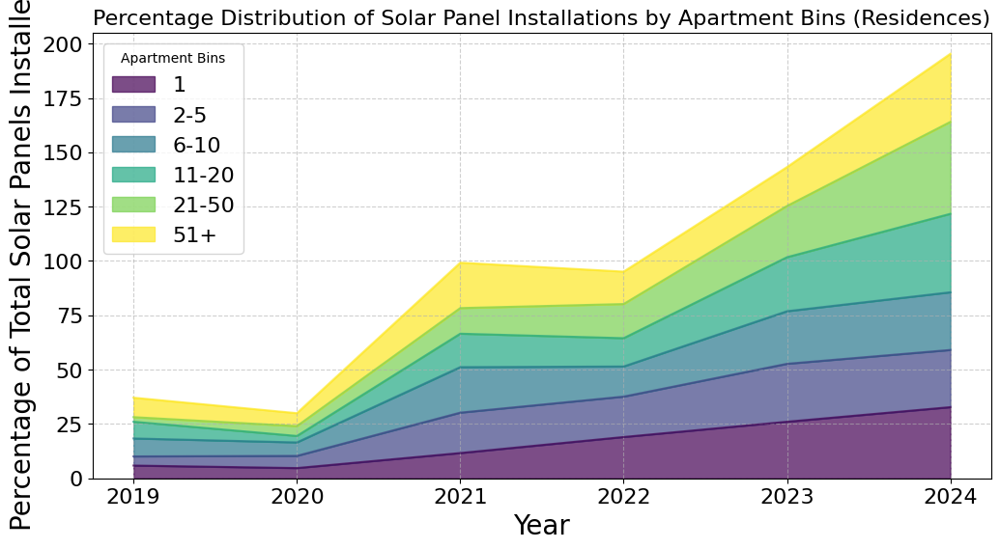

In [ ]:
# Define new bins to separate buildings with one apartment
bin_edges = [0, 1, 5, 10, 20, 50, 1000]
bin_labels = ['1', '2-5', '6-10', '11-20', '21-50', '51+']

# Bin apartment numbers
buildings_data['apartment_bins'] = pd.cut(buildings_data['appartment'], bins=bin_edges, labels=bin_labels)

# Filter data to include only residential buildings
buildings_data_res = buildings_data[buildings_data['Usage_Grouped'] == "Residence"]

# Rename solar panel columns to remove the prefix for readability
solar_columns_renamed = {col: col.replace('solar_', '') for col in solar_columns}
buildings_data_res['apartment_bins'] = pd.cut(buildings_data_res['appartment'], bins=bin_edges, labels=bin_labels)

# Aggregate solar panel counts per bin by year
solar_trend_by_bins_res = buildings_data_res.groupby('apartment_bins')[solar_columns].sum()

# Convert to relative values (percentage of installations per bin per year)
solar_trend_by_bins_res_relative = solar_trend_by_bins_res.div(solar_trend_by_bins_res.sum(axis=1), axis=0) * 100
solar_trend_by_bins_res_relative.rename(columns=solar_columns_renamed, inplace=True)

# Normalize data so that each year sums to 100% (100% stacked area chart)
solar_trend_by_bins_res_relative_norm = solar_trend_by_bins_res_relative.div(
    solar_trend_by_bins_res_relative.sum(axis=1), axis=0) * 100

# Plot 100% stacked area chart
plt.figure(figsize=(12, 6))
solar_trend_by_bins_res_relative_norm.T.plot(kind='area', colormap='viridis', alpha=0.7, figsize=(12, 6))

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.title('Percentage Distribution of Solar Panel Installations by Apartment Bins (Residences)', fontsize=16)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Percentage of Total Solar Panels Installed', fontsize=20)
plt.legend(title="Apartment Bins", fontsize=16, loc="upper left")
plt.grid(True, linestyle='--', alpha=0.6)
plt.savefig("Solar_adoption_rate_by_number_apartments.pdf", format="pdf", bbox_inches="tight")

plt.show()

/tmp/ipykernel_372904/4045705443.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  buildings_data_res['solar_installed_any'] = buildings_data_res[solar_columns].max(axis=1)
/tmp/ipykernel_372904/4045705443.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  solar_buildings_per_bin = buildings_data_res.groupby('apartment_bins')['solar_installed_any'].sum()
/tmp/ipykernel_372904/4045705443.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for

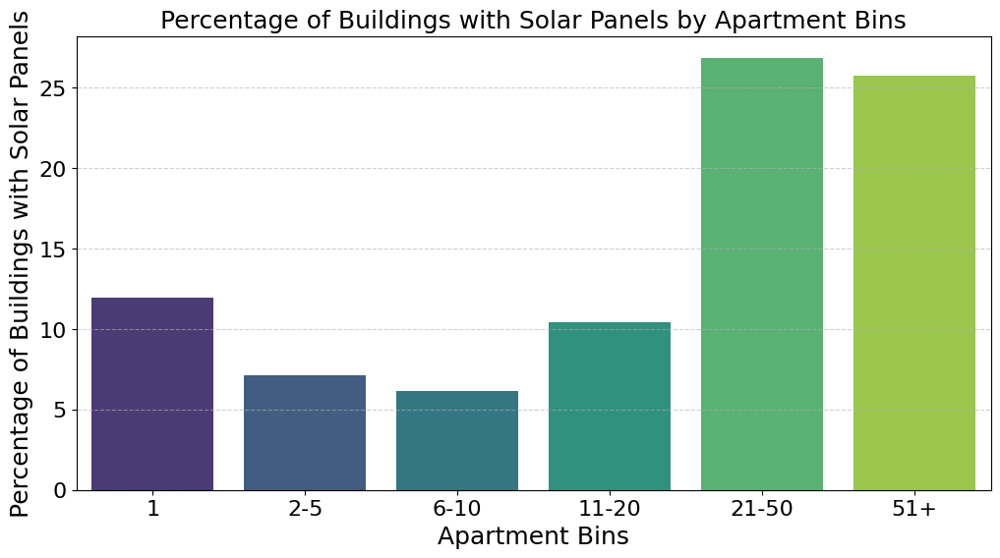

In [ ]:
# Create a binary column indicating if any solar panel is installed
buildings_data_res['solar_installed_any'] = buildings_data_res[solar_columns].max(axis=1)

# Count total buildings per apartment bin
total_buildings_per_bin = buildings_data_res['apartment_bins'].value_counts().sort_index()

# Count buildings with solar panels per bin
solar_buildings_per_bin = buildings_data_res.groupby('apartment_bins')['solar_installed_any'].sum()

# Calculate the percentage of buildings with solar panels in each bin
solar_percentage_per_bin = (solar_buildings_per_bin / total_buildings_per_bin) * 100

# Plot the percentage of structures with solar panels by apartment bins
plt.figure(figsize=(12, 6))
sns.barplot(x=solar_percentage_per_bin.index, y=solar_percentage_per_bin.values, palette="viridis")

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Enhance plot aesthetics
plt.title('Percentage of Buildings with Solar Panels by Apartment Bins', fontsize=18)
plt.xlabel('Apartment Bins', fontsize=18)
plt.ylabel('Percentage of Buildings with Solar Panels', fontsize=18)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig("Solar_adoption_by_number_apartments.pdf", format="pdf", bbox_inches="tight")

plt.show()

In [ ]:
buildings_data_res['apartment_bins'].value_counts()

apartment_bins
1        13769
6-10      2998
2-5       2080
11-20      940
21-50      614
51+        128
Name: count, dtype: int64

In [ ]:
# Filter data to include only buildings with solar panels installed
kepler_data = gdf[gdf['solar_installed'] == 1].copy()
kepler_data['install_year'] = kepler_data['install_year'].astype(int)

# 1. Convert 'install_year' to datetime (assuming 'install_year' is integer or string like 2019, 2020, etc.)
kepler_data['start_date'] = pd.to_datetime(kepler_data['install_year'].astype(str), format='%Y')

# 2. Assign a far-future 'end_date' so that installations remain on the map indefinitely
kepler_data['end_date'] = pd.to_datetime('2099-12-31')

# 3. Convert datetime columns to ISO8601 string format
kepler_data['start_date'] = kepler_data['start_date'].dt.strftime('%Y-%m-%dT%H:%M:%S')
kepler_data['end_date'] = kepler_data['end_date'].dt.strftime('%Y-%m-%dT%H:%M:%S')

# 4. Select only the necessary columns for Kepler.gl
kepler_data = kepler_data[['lat', 'lon', 'Usage_Grouped', 'start_date', 'end_date']]



# Initialize Kepler map
map_1 = KeplerGl(height=3000)

# Add data to the map
map_1.add_data(data=kepler_data, name="Solar Panel Installations")

# Define the map configuration with a timeline and improved visualization
config = {
    "version": "v1",
    "config": {
        "visState": {
            "filters": [
                {
                    "dataId": "Solar Panel Installations",
                    "id": "install_window_filter",
                    "name": ["start_date", "end_date"],
                    "type": "timeRange",
                    "value": [
                        kepler_data['start_date'].min(),  # Use the string directly
                        kepler_data['start_date'].min()   # Same for the initial value
                    ],
                    "enlarged": True,
                    "plotType": "histogram",
                    "animationWindow": "incremental"
                }
            ],
            "layers": [
                {
                    "id": "solar_panel_layer",
                    "type": "point",
                    "config": {
                        "dataId": "Solar Panel Installations",
                        "label": "Solar Panel Installations",
                        "color": [18, 147, 154],
                        "columns": {
                            "lat": "lat",
                            "lng": "lon"
                        },
                        "isVisible": True,
                        "visConfig": {
                            "radius": 15,
                            "fixedRadius": False,
                            "opacity": 0.8,
                            "outline": False,
                            "thickness": 2,
                            "strokeColor": None,
                            "colorRange": {
                                "name": "Category10",
                                "type": "categorical",
                                "category": "Uber",
                                "colors": [
                                    "#1f77b4",  # e.g., Residential
                                    "#ff7f0e"   # e.g., Public
                                ]
                            },
                            "radiusRange": [5, 25],
                            "filled": True
                        },
                        "hidden": False
                    },
                    "visualChannels": {
                        "colorField": {
                            "name": "Usage_Grouped",
                            "type": "string"
                        },
                        "colorScale": "ordinal"
                    }
                }
            ],
            "interactionConfig": {
                "tooltip": {
                    "fieldsToShow": {
                        "Solar Panel Installations": ["Usage_Grouped", "start_date"]
                    },
                    "enabled": True
                }
            },
            "layerBlending": "normal",
            "splitMaps": [],
            "animationConfig": {
                "currentTime": None,
                "speed": 1
            }
        },
        "mapState": {
            "bearing": 0,
            "dragRotate": False,
            "latitude": kepler_data['lat'].mean(),
            "longitude": kepler_data['lon'].mean(),
            "pitch": 0,
            "zoom": 12,
            "isSplit": False
        },
        "mapStyle": {
            "topLayerGroups": {},
            "visibleLayerGroups": {
                "label": True,
                "road": True,
                "border": False,
                "building": True,
                "water": True,
                "land": True,
                "3d building": True
            },
            "threeDBuildingColor": [9.665468314072013, 17.183054780572488, 31.1442867897876],
            "mapStyles": {}
        }
    }
}

# Apply configuration to the map
map_1.config = config

# Save to HTML with full screen mode
map_1.save_to_html(file_name="solar_panel_installation_kepler.html")